# importing libraries

In [71]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
import glob as gb
import cv2
from tensorflow import keras
#from keras.models import Model
#from keras.layers import Dense
from tensorflow.keras.preprocessing import image
from sklearn.metrics import confusion_matrix,classification_report,f1_score,recall_score,precision_score,accuracy_score
import seaborn as sns
import tkinter as tk
from tkinter import filedialog
from PIL import Image, ImageTk
import warnings
import tensorflow as tf
warnings.filterwarnings('ignore')


# Dataset

## Description
#### We'll be using a dataset containing images of different types of vegetables. The dataset is divided into `training`, `validation`, and `test` sets.


In [30]:
train_path = 'Vegetabels/Vegetable Images/train/'
validation_path= 'Vegetabels/Vegetable Images/validation/'
test_path = 'Vegetabels/Vegetable Images/test/'
image_categories = os.listdir(train_path) #print name of categories
print(image_categories)

['Bean', 'Bitter_Gourd', 'Bottle_Gourd', 'Brinjal', 'Broccoli', 'Cabbage', 'Capsicum', 'Carrot', 'Cauliflower', 'Cucumber', 'Papaya', 'Potato', 'Pumpkin', 'Radish', 'Tomato']


## Dataset Visualization
### Sample Images
To gain a visual understanding of our dataset, let's plot sample images from each category. This will provide insights into the variety and quality of images present in our dataset.


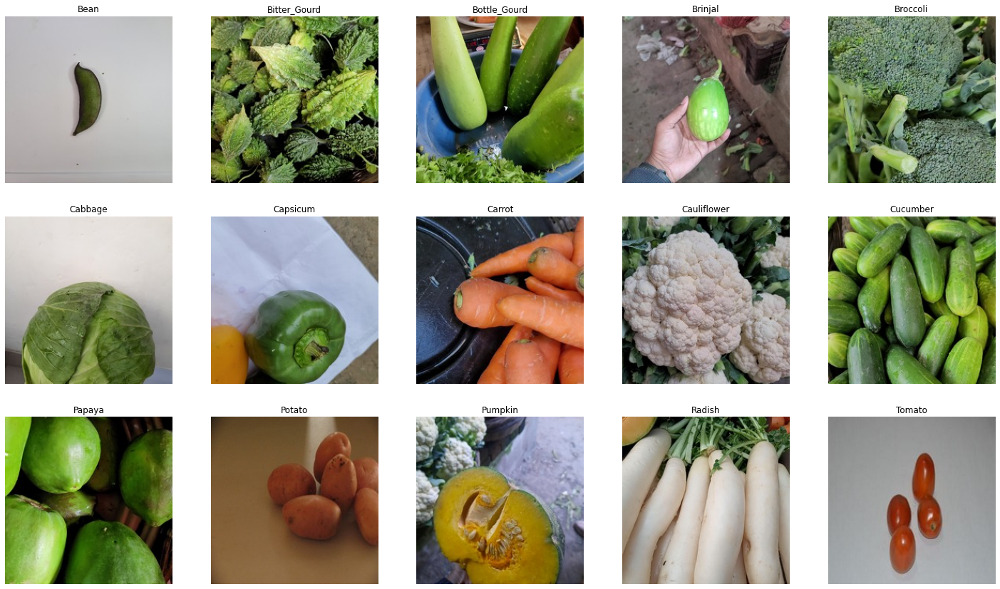

In [31]:
def plot_images(image_categories):
    
    # Create a figure
    plt.figure(figsize=(25, 25))
    for i, cat in enumerate(image_categories):
        
        # Load images for the ith category
        image_path = train_path + '/' + cat
        images_in_folder = os.listdir(image_path)
        first_image_of_folder = images_in_folder[0]
        first_image_path = image_path + '/' + first_image_of_folder
        img = image.load_img(first_image_path)
        img_arr = image.img_to_array(img)/255.0
        
        
        # Create Subplot and plot the images
        plt.subplot(5, 5, i+1)
        plt.imshow(img_arr)
        plt.title(cat)
        plt.axis('off')
        
    plt.show()
plot_images(image_categories)

## Dataset Exploration
### Training Data Analysis
As we embark on our journey into vegetable classification, it's crucial to understand the composition of our training dataset. Let's delve into the details and uncover insights that will guide our model development process. and ask  very important questions 


# Questions to Ponder
`Distribution Analysis:` **What does the distribution of images across different categories reveal about the dataset?**

`Class Imbalance:` Are there significant variations in the number of images per category, potentially leading to class imbalances?

`Data Quality:` Do the number of images align with our expectations for each category, indicating the quality and completeness of the dataset?

`Training Considerations:` How might the insights gained from this analysis inform our approach to model training and validation?

let's start with traing set

In [32]:
for folder in os.listdir(train_path) : 
    files = gb.glob(pathname= str( train_path +folder + '/*.jpg'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 1000 in folder Bean
For training data , found 1000 in folder Bitter_Gourd
For training data , found 1000 in folder Bottle_Gourd
For training data , found 1000 in folder Brinjal
For training data , found 1000 in folder Broccoli
For training data , found 1000 in folder Cabbage
For training data , found 1000 in folder Capsicum
For training data , found 1000 in folder Carrot
For training data , found 1000 in folder Cauliflower
For training data , found 1000 in folder Cucumber
For training data , found 1000 in folder Papaya
For training data , found 1000 in folder Potato
For training data , found 1000 in folder Pumpkin
For training data , found 1000 in folder Radish
For training data , found 1000 in folder Tomato


##### checking for validation set, too

In [33]:
for folder in os.listdir(validation_path) : 
    files = gb.glob(pathname= str( validation_path +folder + '/*.jpg'))
    print(f'For validation data , found {len(files)} in folder {folder}')

For validation data , found 200 in folder Bean
For validation data , found 200 in folder Bitter_Gourd
For validation data , found 200 in folder Bottle_Gourd
For validation data , found 200 in folder Brinjal
For validation data , found 200 in folder Broccoli
For validation data , found 200 in folder Cabbage
For validation data , found 200 in folder Capsicum
For validation data , found 200 in folder Carrot
For validation data , found 200 in folder Cauliflower
For validation data , found 200 in folder Cucumber
For validation data , found 200 in folder Papaya
For validation data , found 200 in folder Potato
For validation data , found 200 in folder Pumpkin
For validation data , found 200 in folder Radish
For validation data , found 200 in folder Tomato


#### And finally checking for testing set

In [34]:
for folder in os.listdir(test_path) : 
    files = gb.glob(pathname= str( test_path +folder + '/*.jpg'))
    print(f'For testing data , found {len(files)} in folder {folder}')

For testing data , found 200 in folder Bean
For testing data , found 200 in folder Bitter_Gourd
For testing data , found 200 in folder Bottle_Gourd
For testing data , found 200 in folder Brinjal
For testing data , found 200 in folder Broccoli
For testing data , found 200 in folder Cabbage
For testing data , found 200 in folder Capsicum
For testing data , found 200 in folder Carrot
For testing data , found 200 in folder Cauliflower
For testing data , found 200 in folder Cucumber
For testing data , found 200 in folder Papaya
For testing data , found 200 in folder Potato
For testing data , found 200 in folder Pumpkin
For testing data , found 200 in folder Radish
For testing data , found 200 in folder Tomato


In [35]:
size = []
for folder in  os.listdir(train_path) : 
    files = gb.glob(pathname= str( train_path + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(224, 224, 3)    14994
(200, 224, 3)        1
(205, 224, 3)        1
(210, 224, 3)        1
(193, 224, 3)        1
(198, 224, 3)        1
(211, 224, 3)        1
dtype: int64

In [36]:
size = []
for folder in  os.listdir(validation_path) : 
    files = gb.glob(pathname= str( validation_path + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(224, 224, 3)    2998
(187, 224, 3)       1
(223, 224, 3)       1
dtype: int64

In [37]:
size = []
for folder in  os.listdir(test_path) : 
    files = gb.glob(pathname= str( test_path + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(224, 224, 3)    2999
(207, 224, 3)       1
dtype: int64

# Let's Answer the Questions

Based on our dataset exploration, we've gained valuable insights into the characteristics of our dataset. Here's a summary of our findings:

```diff
+ All data is balanced, with an equal number of images in each category. This balanced distribution ensures that our model receives sufficient training examples for each class, contributing to improved performance and generalization.

+ We are satisfied with the overall data quality, as the images appear to be clear, properly labeled, and representative of their respective categories.
 
+ Ensuiring that the data is loaded correctly 

- However, we observed variations in image sizes within the dataset. These differences in image dimensions can potentially pose challenges during model training and inference, as convolutional neural networks typically require input images of uniform size.


But first let's prepare our catogeries and apply encoding for them

In our vegetable classification project, we've assigned unique numerical codes to each vegetable category. This coding scheme allows us to represent vegetables in a numerical format, which is essential for training machine learning models.

1. To begin, let's take a look at our code dictionary, which maps numerical codes to vegetable categories:
2. then, let's dive into the getcode function, which serves as our decoding mechanism. This function takes a numerical code as input and returns the corresponding vegetable category

In [38]:
code = {'Bean':0 ,'Bitter_Gourd':1,'Bottle_Gourd':2,'Brinjal':3,'Broccoli':4,'Cabbage':5,'Capsicum':6,'Carrot':7,
        'Cauliflower':8,'Cucumber':9,'Papaya':10,'Potato':11,'Pumpkin':12,'Radish':13,'Tomato':14}

def getcode(n) : 
    for x , y in code.items() : 
        if n == y : 
            return x 

In [39]:
new_size =190

# resizing and normilzation traing data and splitting them into X_train --> the image input y_train --> the label

## Preprocessing the Training Data
To resize and normalize the training data, we'll iterate through each category folder in the training dataset. Within each folder, we'll process each image file by:

1. `Resizing:` Using OpenCV (`cv2`), we'll read the image file and resize it to a predetermined size (`new_size`).
2. `Normalization:` We'll normalize the pixel values of the resized image array by dividing each pixel value by `255.0`, ensuring that they fall within the range of 0 to 1.

and for splitting 
1. `X_train` appending the norimalized image
2. `y_train` appending the numerical encoding of the label

In [40]:
#resize and normalize train data
X_train = []
y_train = []
for folder in  os.listdir(train_path) : 
    files = gb.glob(pathname= str( train_path + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (new_size,new_size))
        normalized_image = image_array / 255.0
        X_train.append(list(normalized_image))
        y_train.append(code[folder])

### Showing 36 random images after resizing and normalization from training test

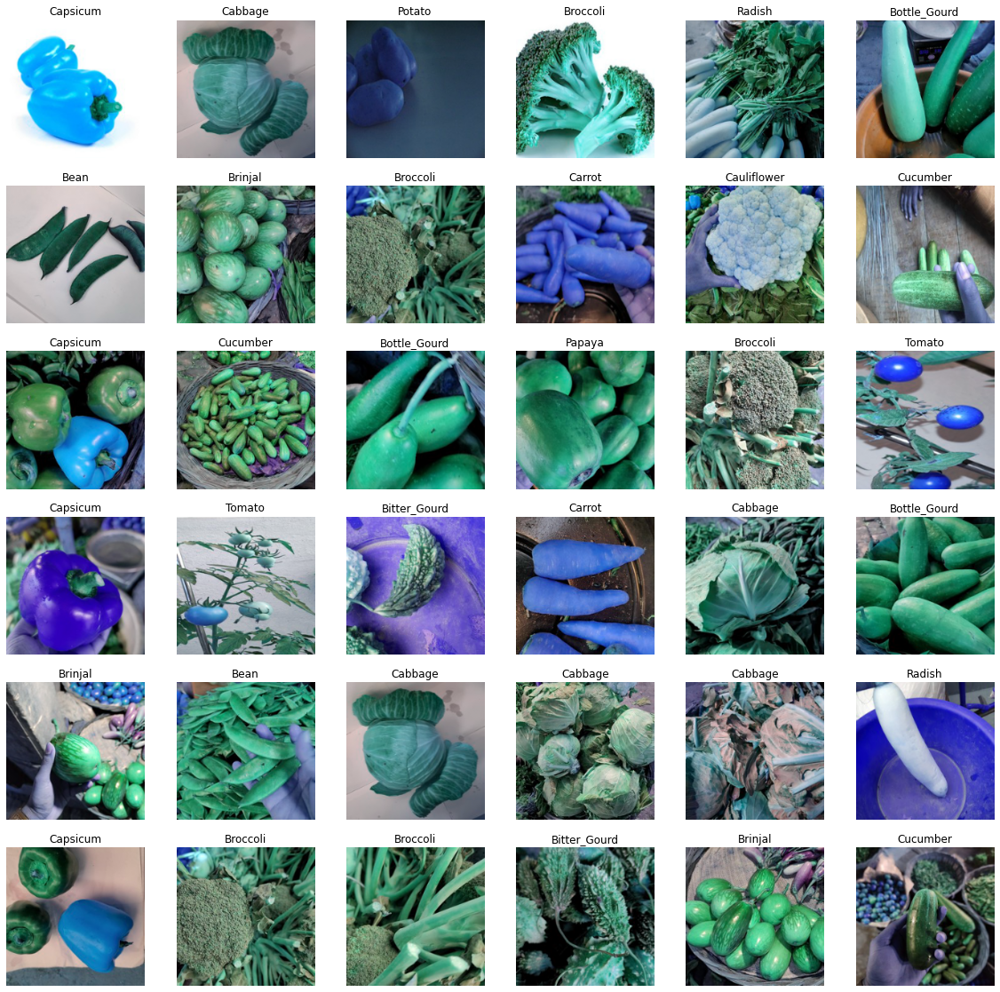

In [41]:

plt.figure(figsize=(20,20))

for n , i in enumerate(np.random.randint(0,len(X_train),36)) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])   
    plt.axis('off')
    plt.title(getcode(y_train[i]))

## the same previous steps is applied to validation set

In [42]:
#resize and normalize validation data
X_val = []  
y_val = []
for folder in  os.listdir(validation_path):
    files = gb.glob(pathname= str( validation_path + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (new_size,new_size))
        normalized_image = image_array / 255.0
        X_val.append(list(normalized_image))
        y_val.append(code[folder])  
          

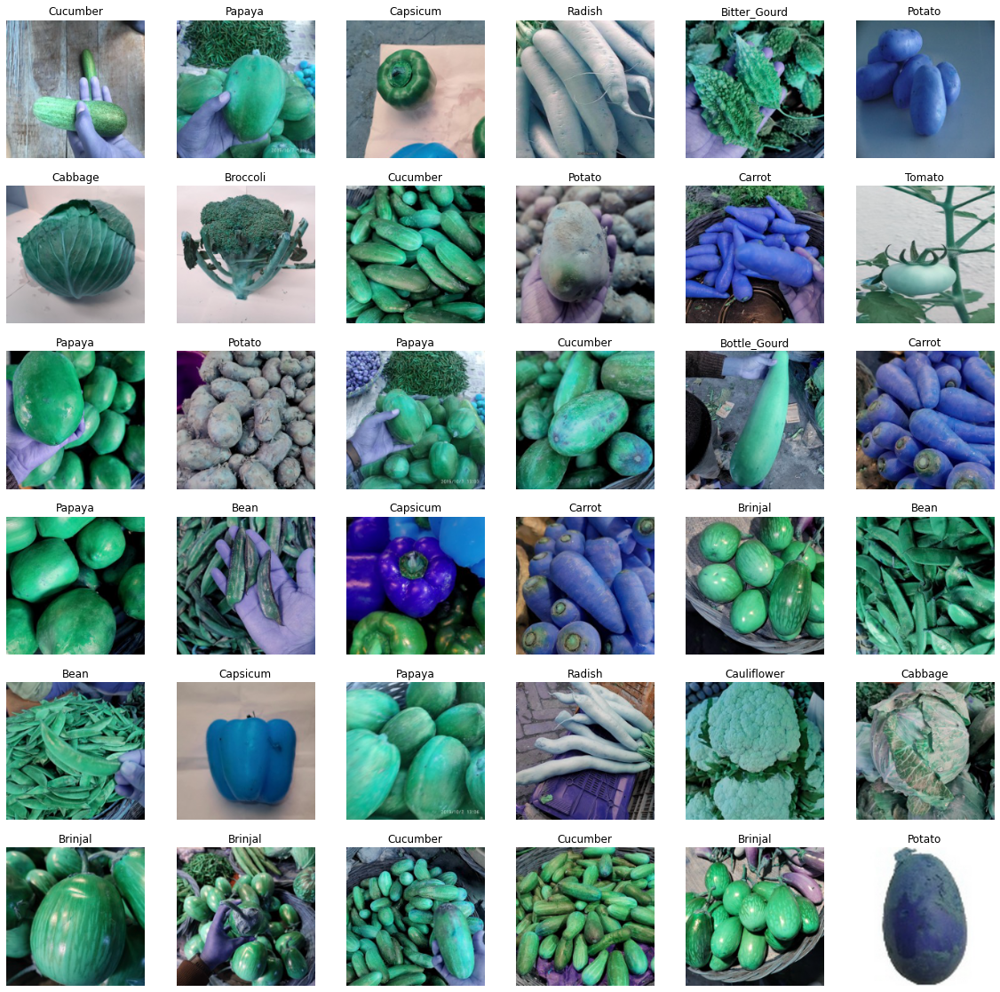

In [43]:
plt.figure(figsize=(20,20))

for n , i in enumerate(np.random.randint(0,len(X_val),36)) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_val[i])   
    plt.axis('off')
    plt.title(getcode(y_val[i]))

## Finally we apply the same for testing

In [44]:
#resize and normalize test data
X_test = []
y_test = []
for folder in  os.listdir(test_path):
    files = gb.glob(pathname= str( test_path + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (new_size,new_size))
        normalized_image = image_array / 255.0
        X_test.append(list(normalized_image))
        y_test.append(code[folder])

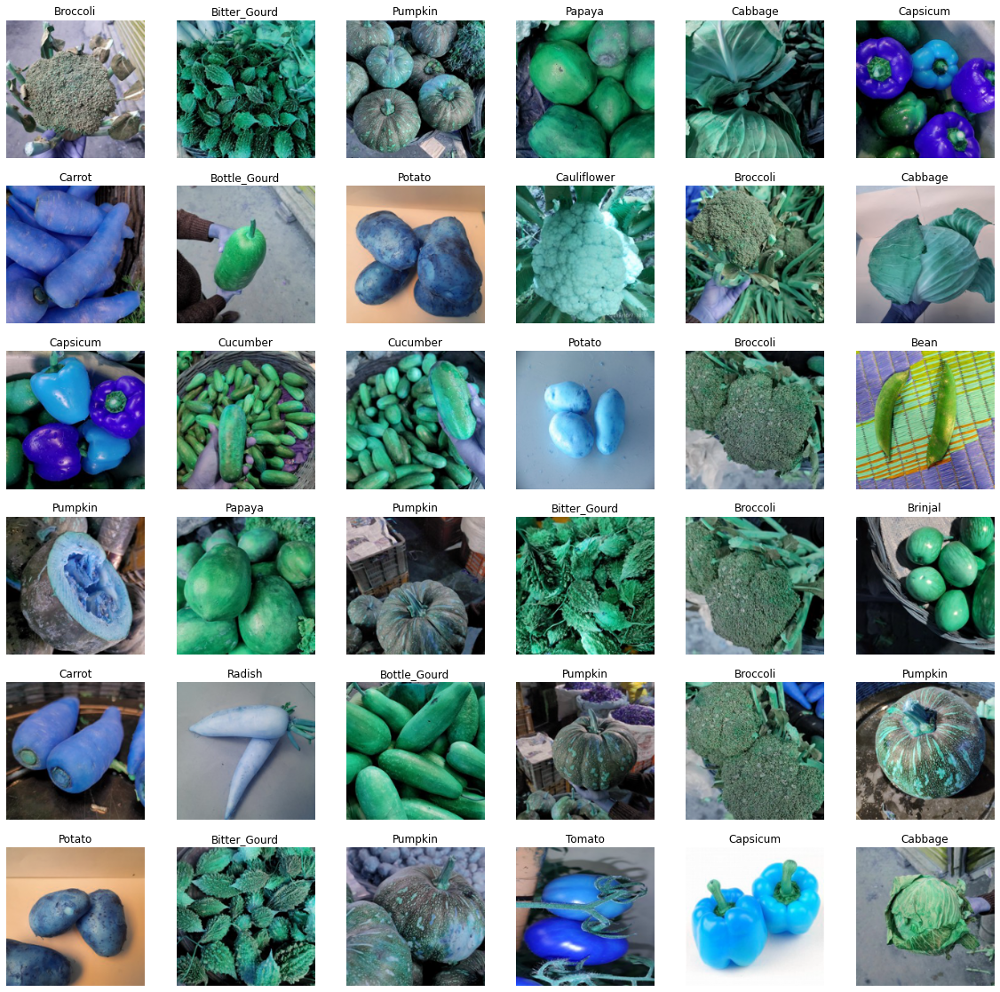

In [45]:
# show the imgages
plt.figure(figsize=(20,20))

for n , i in enumerate(np.random.randint(0,len(X_test),36)) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])   
    plt.axis('off')
    plt.title(getcode(y_test[i]))

In [46]:
# print the length of X_train , y_train , X_val , y_val , X_test , y_test
print(f'we have {len(X_test)} items in X_test') 
print(f'we have {len(y_test)} items in y_test')
print(f'we have {len(X_val)} items in X_val')
print(f'we have {len(y_val)} items in y_val')
print(f'we have {len(X_train)} items in X_train')
print(f'we have {len(y_train)} items in y_train')


we have 3000 items in X_test
we have 3000 items in y_test
we have 3000 items in X_val
we have 3000 items in y_val
we have 15000 items in X_train
we have 15000 items in y_train


There is no NULL values

In [54]:
X_train = np.array(X_train)
y_train = np.array(y_train)
X_val = np.array(X_val)
y_val = np.array(y_val)
X_test = np.array(X_test)
y_test = np.array(y_test)
#now print thier size
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)
print(X_test.shape)
print(y_test.shape)

(15000, 190, 190, 3)
(15000,)
(3000, 190, 190, 3)
(3000,)
(3000, 190, 190, 3)
(3000,)


## Building the Model with Best Parameters using CNN

To construct our vegetable classification model, we'll utilize a Convolutional Neural Network (CNN) architecture. Since the resized images have dimensions of 190x190 pixels with 3 color channels

`input Layer:` The input layer has 190x190x3 neurons, matching the dimensions of the resized input images.

`Convolutional Layers:` Two convolutional layers with 32 and 64 filters, respectively, are utilized to extract features from the input images.  

`Max Pooling Layers:`  Max pooling layers downsample the feature maps, reducing spatial dimensions while preserving important features.

`Flatten Layer:` The flatten layer converts the 2D feature maps into a 1D vector for input to the fully connected layers.

`Dense Layers:` Two dense layers with 130 and 128 neurons, respectively, extract higher-level features.

`Dropout Layers:` Dropout layers prevent overfitting by randomly deactivating neurons during training.

`Output Layer:` The output layer consists of 15 neurons, each representing one of the vegetable categories. The softmax activation function ensures that the output values represent class probabilities.

In [51]:
# Building the model with best parameters using CNN
model = keras.models.Sequential([
    keras.layers.Conv2D(32, kernel_size=3, strides=1, padding='same', activation='relu', input_shape=(new_size, new_size, 3)),
    keras.layers.MaxPooling2D(2),
    keras.layers.Conv2D(64, kernel_size=3, strides=1, padding='same', activation='relu'),
    keras.layers.MaxPooling2D(2),
    keras.layers.Flatten(),
    keras.layers.Dense(130, activation='relu'),
    keras.layers.Dropout(0.25),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(50,  activation='relu') , 
    keras.layers.Dropout(rate=0.5),    
    keras.layers.Dense(15, activation='softmax')
])


## let's take a closer look inside the model

In [52]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 190, 190, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 95, 95, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 95, 95, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 47, 47, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 141376)            0         
_________________________________________________________________
dense (Dense)                (None, 130)               18379010  
_________________________________________________________________
dropout (Dropout)            (None, 130)               0

# Optimizing Model Performance with Early Stopping

In our quest to build the best vegetable classification model, we employ the technique of early stopping to prevent overfitting and improve training efficiency. Early stopping allows us to monitor the model's performance during training and halt the training process if the validation loss stops improving.

**First Early Stopping**

`Patience:` We set a patience value of 5 epochs, indicating the number of epochs to wait before terminating training if no improvement in validation loss is observed.

**Model Compilation**

`Optimizer:` We use the Adam optimizer, a popular choice for training deep learning models due to its adaptive learning rate capabilities.

`Loss Function:` The sparse categorical crossentropy loss function is well-suited for multi-class classification tasks with integer labels.

`Metrics:` We track the accuracy metric during training to evaluate the performance of our model on the validation dataset.


In [53]:
early_stopping = keras.callbacks.EarlyStopping(patience=5) # Set up callbacks
model.compile(optimizer='Adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])


In [55]:
# now train the model using fit method and validation data
history = model.fit(X_train, y_train, epochs=100, batch_size=64, validation_data=(X_val, y_val), callbacks=[early_stopping])

Train on 15000 samples, validate on 3000 samples
Epoch 1/100
15000/15000 [==============================] - 917s 61ms/sample - loss: 2.1899 - acc: 0.2735 - val_loss: 1.2566 - val_acc: 0.6040
Epoch 2/100
15000/15000 [==============================] - 818s 55ms/sample - loss: 1.2592 - acc: 0.5807 - val_loss: 0.6310 - val_acc: 0.8200
Epoch 3/100
15000/15000 [==============================] - 786s 52ms/sample - loss: 0.8517 - acc: 0.7225 - val_loss: 0.5014 - val_acc: 0.8523
Epoch 4/100
15000/15000 [==============================] - 771s 51ms/sample - loss: 0.6150 - acc: 0.8111 - val_loss: 0.4868 - val_acc: 0.8653
Epoch 5/100
15000/15000 [==============================] - 741s 49ms/sample - loss: 0.4543 - acc: 0.8598 - val_loss: 0.3144 - val_acc: 0.9163
Epoch 6/100
15000/15000 [==============================] - 688s 46ms/sample - loss: 0.3596 - acc: 0.8914 - val_loss: 0.3042 - val_acc: 0.9160
Epoch 7/100
15000/15000 [==============================] - 679s 45ms/sample - loss: 0.2952 - acc: 0

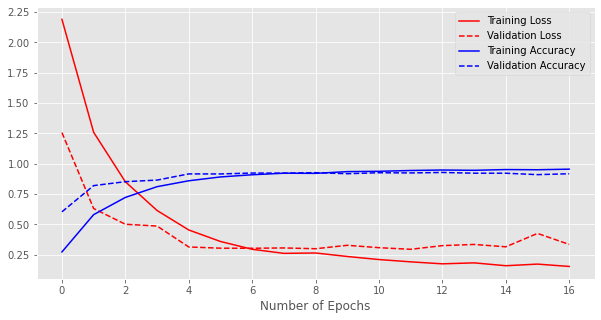

In [70]:
h = history.history
plt.style.use('ggplot')
plt.figure(figsize=(10, 5))
plt.plot(h['loss'], c='red', label='Training Loss')
plt.plot(h['val_loss'], c='red', linestyle='--', label='Validation Loss')
plt.plot(h['acc'], c='blue', label='Training Accuracy')
plt.plot(h['val_acc'], c='blue', linestyle='--', label='Validation Accuracy')
plt.xlabel("Number of Epochs")
plt.legend(loc='best')
plt.show()

In [ ]:


'''
early_stopping = keras.callbacks.EarlyStopping(patience=5) # Set up callbacks
model.compile(optimizer='Adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train for two more epochs, starting from the 16th epoch
history = model.fit(X_train, y_train, epochs=17, initial_epoch=15, batch_size=64, validation_data=(X_val, y_val), callbacks=[early_stopping])
'''

Train on 15000 samples, validate on 3000 samples
Epoch 16/17
15000/15000 [==============================] - 704s 47ms/sample - loss: 0.1613 - acc: 0.9555 - val_loss: 0.3741 - val_acc: 0.9213
Epoch 17/17
15000/15000 [==============================] - 678s 45ms/sample - loss: 0.1684 - acc: 0.9521 - val_loss: 0.3275 - val_acc: 0.9273


## when we add two more epochs the accauracy changed a little bit

# testing

## the evaluate the model

In [57]:

# Evaluate the model
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test accuracy:', test_acc,'Test loss:',test_loss)

3000/3000 [==============================] - 50s 17ms/sample - loss: 0.3406 - acc: 0.9270
Test accuracy: 0.927 Test loss: 0.34057174744599616


## Make predictions

In [58]:
# predict the test data
y_pred = model.predict(X_test)

print('Prediction Shape is {}'.format(y_pred.shape))

Prediction Shape is (3000, 15)


## let's see our model and test it on random images from testing 

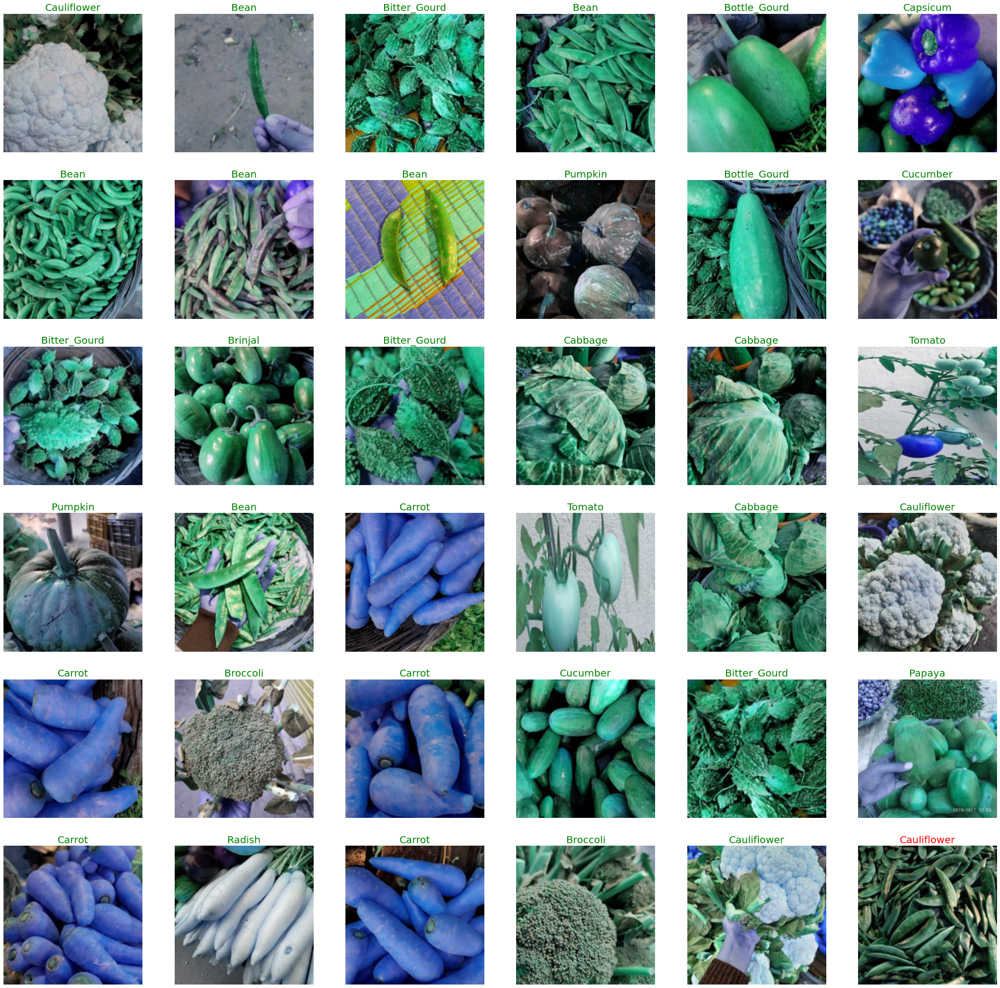

In [61]:
pred_lbls=[np.argmax(lbl) for lbl in y_pred ]
pred_lbls=np.array(pred_lbls)
pred_lbls
plt.figure(figsize=(36, 36))
for n, i in enumerate(list(np.random.randint(0, len(X_test), 36))):
    plt.subplot(6, 6, n+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    color = "green" #True

    # Checks if the true label and the predicted label for the current image are different.
    if y_test[i] != pred_lbls[i]:
        color = "red" #wrong
    
    plt.title(f'{getcode(pred_lbls[i])}',color=color,size=20)

In [62]:
# save the model 
model.save('vegetable_classifier.model')



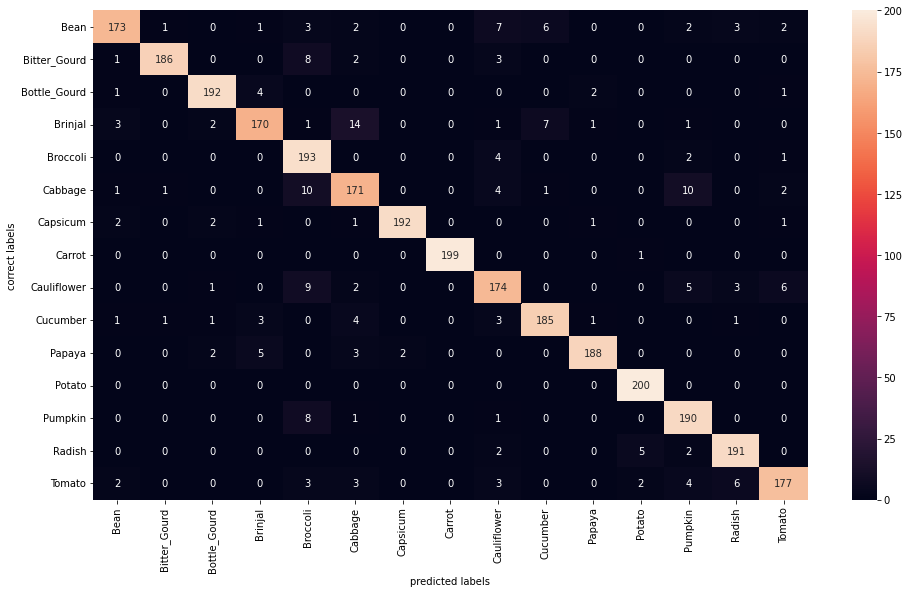

In [63]:
# make a confusion matix showing the name of classes and put it in 20,20
plt.figure(figsize=(16,9))
conf_matrix = confusion_matrix(y_test, y_pred.argmax(axis=1))
sns.heatmap(conf_matrix, annot=True, fmt='d', xticklabels=code, yticklabels=code)
plt.xlabel('predicted labels')
plt.ylabel('correct labels')
plt.show()


In [64]:
# make a report of the model
print(classification_report(y_test, y_pred.argmax(axis=1), target_names=code.keys()))

              precision    recall  f1-score   support

        Bean       0.94      0.86      0.90       200
Bitter_Gourd       0.98      0.93      0.96       200
Bottle_Gourd       0.96      0.96      0.96       200
     Brinjal       0.92      0.85      0.89       200
    Broccoli       0.82      0.96      0.89       200
     Cabbage       0.84      0.85      0.85       200
    Capsicum       0.99      0.96      0.97       200
      Carrot       1.00      0.99      1.00       200
 Cauliflower       0.86      0.87      0.87       200
    Cucumber       0.93      0.93      0.93       200
      Papaya       0.97      0.94      0.96       200
      Potato       0.96      1.00      0.98       200
     Pumpkin       0.88      0.95      0.91       200
      Radish       0.94      0.95      0.95       200
      Tomato       0.93      0.89      0.91       200

    accuracy                           0.93      3000
   macro avg       0.93      0.93      0.93      3000
weighted avg       0.93   

In [72]:
# Calculate Precision score
precision=precision_score(y_test,pred_lbls,average="macro")
print("Precision = {}".format(precision))

# Calculate Recall Score
recall=recall_score(y_test,pred_lbls,average="macro")
print("Recall = {}".format(recall))

# Calculate F1 score
f1 = f1_score(y_test, pred_lbls, average='macro')
print("F1 Score = {}".format(f1))



Precision = 0.9290492307154994
Recall = 0.9269999999999999
F1 Score = 0.9271789741760975


In [65]:
# Function to preprocess the image for prediction
def preprocess_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (190, 190))
    image = np.array(image)
    image = np.expand_dims(image, axis=0)
    image = image / 255.0  # Normalize pixel values
    return image

# Function to classify the image
def classify_image(image_path):
    image = preprocess_image(image_path)
    prediction = model.predict(image)
    class_index = np.argmax(prediction)
    class_label = image_categories[class_index]  
    return class_label

In [ ]:
# Load pre-trained model
model = keras.models.load_model('vegetable_classifier.model')

In [66]:



# Function to display the image
def display_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (400, 400))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = Image.fromarray(image)
    photo = ImageTk.PhotoImage(image)
    image_label.configure(image=photo)
    image_label.image = photo

# Function to handle image selection
def select_func():
    file_path = filedialog.askopenfilename()
    if file_path:
        display_image(file_path)
        prediction = classify_image(file_path)
        result_label.config(text=f'The image is: {prediction}')

# Create GUI window
window = tk.Tk()
window.title('Vegetables Classification')
window.geometry('800x600')

# Add image display label
image_label = tk.Label(window)

# Add image selection button
select_button = tk.Button(window, text='Select Image', font=('Arial', 14), command=select_func)

# Add project name label
classify_label = tk.Label(window, text='Vegetables Classification', font='times 24 bold italic')

# Add classification result labels
result_label = tk.Label(window, font='times 20 bold')

# Position the widgets
image_label.place(x=180, y=100)
select_button.place(x=300, y=500)
classify_label.place(x=230, y=50)
result_label.place(x=250, y=550)

# Start the GUI event loop
window.mainloop()


In [ ]:
print(sorted(image_categories))

['Bean', 'Bitter_Gourd', 'Bottle_Gourd', 'Brinjal', 'Broccoli', 'Cabbage', 'Capsicum', 'Carrot', 'Cauliflower', 'Cucumber', 'Papaya', 'Potato', 'Pumpkin', 'Radish', 'Tomato']


In [74]:
# having the path of the desired image to predict 
im_path = r'D:\old win\download\Third year second term\Neural Network\project\Vegetabels\Vegetable Images\test\Bitter_Gourd\1358.jpg'
# now predict the model
preprocessed_image = preprocess_image(im_path)
predicted_class = model.predict(preprocessed_image)
print(image_categories)
print('the class is ',predicted_class)
# Apply soft max
class_index = np.argmax(predicted_class)
class_label = image_categories[class_index]  
print(class_label)
    

['Bean', 'Bitter_Gourd', 'Bottle_Gourd', 'Brinjal', 'Broccoli', 'Cabbage', 'Capsicum', 'Carrot', 'Cauliflower', 'Cucumber', 'Papaya', 'Potato', 'Pumpkin', 'Radish', 'Tomato']
the class is  [[5.6907366e-04 9.9554175e-01 1.4650940e-06 2.9439241e-07 3.6256744e-03
  1.2559743e-04 1.3870952e-08 8.6925384e-11 8.8618544e-05 1.3004851e-05
  2.1213156e-10 4.4204023e-09 2.8547100e-05 5.6848183e-08 5.9136328e-06]]
Bitter_Gourd
